# 0.0 Create virtualenv

In [2]:
!python -m venv venv

# 0.1 activate virtualenv

In [3]:
!source venv/bin/activate

# 0.2 Install Dependencies

In [5]:
!pip3 install torch torchvision torchaudio
!pip3 install easyocr

     |████████████████████████████████| 1.9 MB 64 kB/s  eta 0:00:01


In [7]:
!pip freeze > requirements.txt

# 0.3 Import Dependencies

In [2]:
import easyocr
import cv2
from matplotlib import pyplot as plt
import numpy as np
import PIL
from PIL import ImageDraw
import re
#import imutils

# 1. Read in images or video

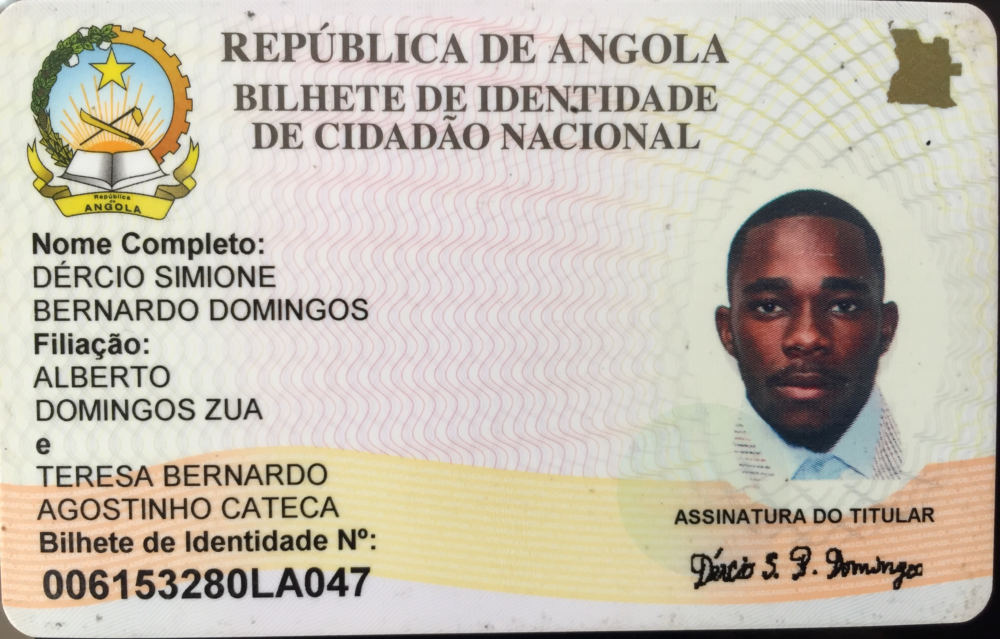

In [3]:
IMAGE_PATH = 'img/BI_Dercio.JPG'
img = PIL.Image.open(IMAGE_PATH)
img

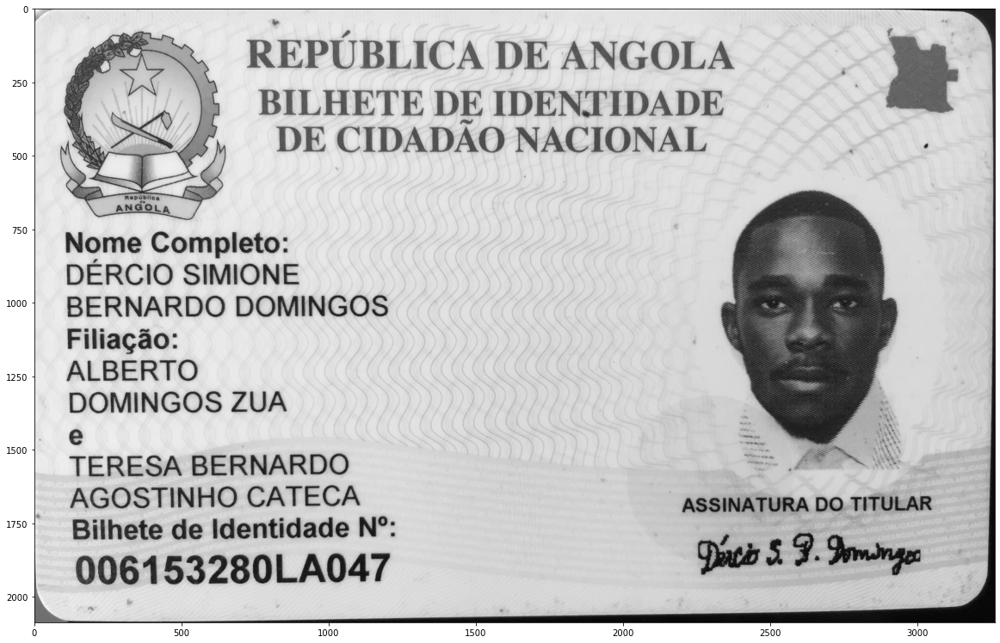

In [4]:
img = cv2.imread('img/BI_Dercio.JPG')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
plt.figure(figsize=(20,20))
plt.imshow(cv2.cvtColor(gray, cv2.COLOR_BGR2RGB))

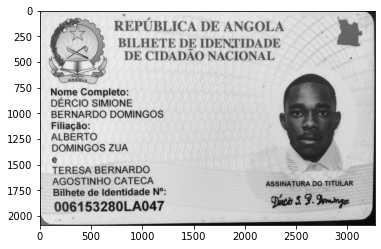

In [5]:
bfilter = cv2.bilateralFilter(gray, 11, 17, 17) #Noise reduction
edged = cv2.Canny(bfilter, 30, 200) #Edge detection
myImg = cv2.cvtColor(bfilter, cv2.COLOR_BGR2RGB)
plt.imshow(cv2.cvtColor(edged, cv2.COLOR_BGR2RGB))
plt.imshow(myImg)

In [6]:
reader = easyocr.Reader(['pt', 'en'], gpu=False)
result = reader.readtext(myImg)
result

Using CPU. Note: This module is much faster with a GPU.


[([[708, 63], [2384, 63], [2384, 227], [708, 227]],
  'REPÚBLICA DE ANGOLA',
  0.9505627785275683),
 ([[749, 256], [2356, 256], [2356, 384], [749, 384]],
  'BILHETE DE IDENTIDADE',
  0.7409007675137931),
 ([[812, 386], [2298, 386], [2298, 503], [812, 503]],
  'DE CIDADAO NACIONAL',
  0.6769340680416439),
 ([[306, 630], [428, 630], [428, 657], [306, 657]],
  'Aapúbllca',
  0.3662925517144127),
 ([[275, 652], [466, 652], [466, 703], [275, 703]],
  'ANGOLA',
  0.7205572308135619),
 ([[97, 744], [882, 744], [882, 864], [97, 864]],
  'Nome Completo:',
  0.9896392001190992),
 ([[99, 836], [912, 836], [912, 956], [99, 956]],
  'DÉRCIO SIMIONE',
  0.999514093340442),
 ([[101, 961], [1214, 961], [1214, 1061], [101, 1061]],
  'BERNARDO DOMINGOS',
  0.8881152158431929),
 ([[100, 1074], [506, 1074], [506, 1187], [100, 1187]],
  'Filiação:',
  0.963213668825708),
 ([[104, 1180], [563, 1180], [563, 1277], [104, 1277]],
  'ALBERTO',
  0.9545576161400052),
 ([[108, 1285], [864, 1285], [864, 1388], [10

In [7]:
print(result[16][1])

006153280LA047


In [13]:

for (bbox, text, prob) in result:
    #if prob >= 0.5:
    # display 
    print(f'{text} (Probability: {prob:.2f})')
    
    #pattern = re.compile(r'\d{9}[A-Z]{2}\d{3}')
    #search_pattern =pattern.search(text)
    #print('Phone number found: ' + search_pattern.group())

REPÚBLICA DE ANGOLA (Probability: 0.95)
BILHETE DE IDENTIDADE (Probability: 0.74)
DE CIDADAO NACIONAL (Probability: 0.68)
Aapúbllca (Probability: 0.37)
ANGOLA (Probability: 0.72)
Nome Completo: (Probability: 0.99)
DÉRCIO SIMIONE (Probability: 1.00)
BERNARDO DOMINGOS (Probability: 0.89)
Filiação: (Probability: 0.96)
ALBERTO (Probability: 0.95)
DOMINGOS ZUA (Probability: 1.00)
e (Probability: 1.00)
TERESA BERNARDO (Probability: 0.92)
AGOSTINHO CATECA (Probability: 0.95)
ASSINATURA DO TITULAR (Probability: 1.00)
Bilhete de Identidade Nª: (Probability: 0.65)
006153280LA047 (Probability: 0.94)
90 $ 9. (Probability: 0.39)
Oom)nje (Probability: 0.06)


In [ ]:
def overlay_ocr_text(img_path, save_name):
    '''loads an image, recognizes text, and overlays the text on the image.'''
    
    # loads image
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    dpi = 80
    fig_width, fig_height = int(img.shape[0]/dpi), int(img.shape[1]/dpi)
    plt.figure()
    f, axarr = plt.subplots(1,2, figsize=(fig_width, fig_height)) 
    axarr[0].imshow(img)
    
    # recognize text
    result = recognize_text(img_path)

    # if OCR prob is over 0.5, overlay bounding box and text
    for (bbox, text, prob) in result:
        if prob >= 0.5:
            # display 
            print(f'Detected text: {text} (Probability: {prob:.2f})')

            # get top-left and bottom-right bbox vertices
            (top_left, top_right, bottom_right, bottom_left) = bbox
            top_left = (int(top_left[0]), int(top_left[1]))
            bottom_right = (int(bottom_right[0]), int(bottom_right[1]))

            # create a rectangle for bbox display
            cv2.rectangle(img=img, pt1=top_left, pt2=bottom_right, color=(255, 0, 0), thickness=10)

            # put recognized text
            cv2.putText(img=img, text=text, org=(top_left[0], top_left[1] - 10), fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=1, color=(255, 0, 0), thickness=8)
        
    # show and save image
    axarr[1].imshow(img)
    plt.savefig(f'{save_name}_overlay.jpg', bbox_inches='tight')

# 2. Handling Multiple Lines

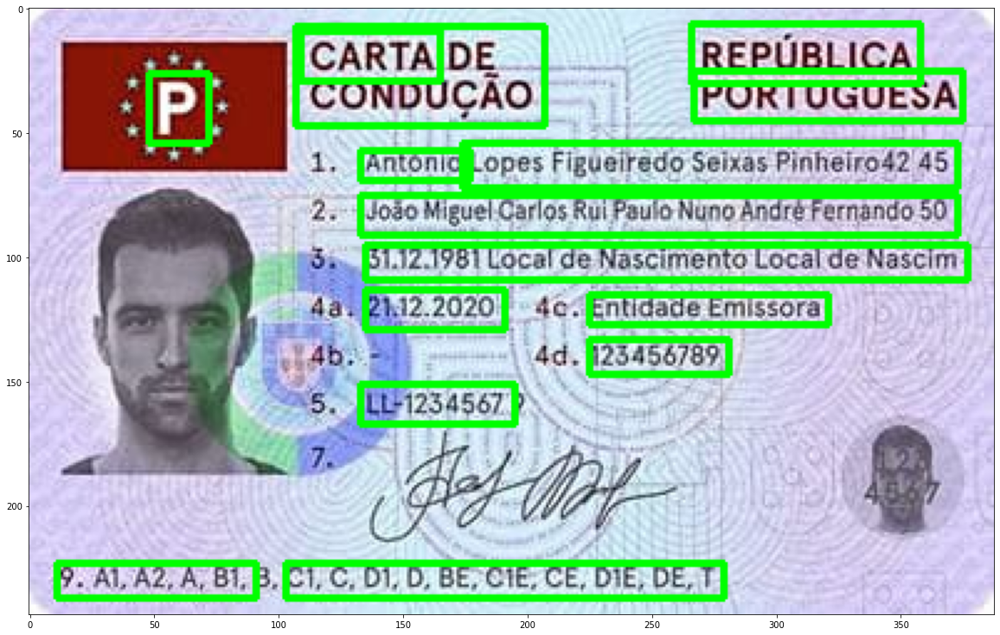

In [30]:
img = cv2.imread(IMAGE_PATH)
for detection in result:
    top_left = tuple([int(val) for val in detection[0][0]])
    bottom_right = tuple([int(val) for val in detection[0][2]])
    #text = detection[1]
    font = cv2.FONT_HERSHEY_SIMPLEX
    img = cv2.rectangle(img, top_left, bottom_right, (0,255,0), 2)
    #img = cv2.putText(img, text, top_left, font, 2, (255,255,255), 5, cv2.LINE_AA)

plt.figure(figsize=(20, 20))
plt.imshow(img)
plt.show()

# Take the face

In [36]:
image = cv2.imread(IMAGE_PATH)
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

In [43]:
faceCascade = cv2.CascadeClassifier(cv2.data.haarcascades + "haarcascade_frontalface_default.xml")
faces = faceCascade.detectMultiScale(
        gray,
        scaleFactor=1.3,
        minNeighbors=10,
        minSize=(40, 40)
)

print("Found {0} Faces!".format(len(faces)))

Found 1 Faces!


In [44]:
for (x, y, w, h) in faces:
    cv2.rectangle(image, (x, y), (x+w, y+h), (0, 255, 0), 2)

In [45]:
status = cv2.imwrite('saved/faces_detected.jpg', image)

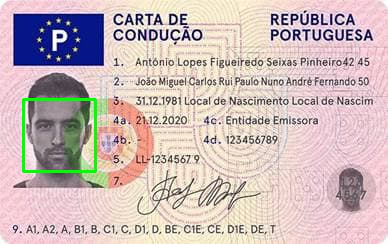

In [46]:
thisImg = PIL.Image.open('saved/faces_detected.jpg')
thisImg

In [47]:
print ("Image faces_detected.jpg written to filesystem: ",status)

Image faces_detected.jpg written to filesystem:  True


In [48]:
for (x, y, w, h) in faces:
    cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)
    roi_color = image[y:y + h, x:x + w]
    print("[INFO] Object found. Saving locally.")
    cv2.imwrite(str(w) + str(h) + '_faces.jpg', roi_color)

[INFO] Object found. Saving locally.
